# Betting on Football

In [1]:
#TO IMPROVE

# Find the players that scored often during the last games + compute average time playing per game
# check change of coach
# put a higher weight on the recent games
# check max serie > 10, print ?
# Run automatically the program
# stock the game history
# Why Maproba not mutiple of 0.05
# do the same but not including at home or away
# Odd > 10 take in account who did it, and plot it


In [123]:
%run ./PProcess0.ipynb
# https://chrome.softwaredownload.co.in/chrome-91-0-4472
driver = webdriver.Chrome(ChromeDriverManager().install())



====== WebDriver manager ======
Current google-chrome version is 91.0.4472
Get LATEST driver version for 91.0.4472
Driver [C:\Users\Valentin\.wdm\drivers\chromedriver\win32\91.0.4472.101\chromedriver.exe] found in cache


In [124]:
goAllBets = False
%run ./functions/Unibet.ipynb

  0%|          | 0/18 [00:00<?, ?it/s]

Dataset Check is not found


  0%|          | 0/18 [00:02<?, ?it/s]


KeyError: 'eventHeader'

KeyError: 'eventHeader'

In [134]:
url = "https://www.unibet.fr/zones/v3/sportnode/markets.json?nodeId=2243762&filter=R%C3%A9sultat&marketname=R%C3%A9sultat%20du%20match"
response = requests.get(url)
json_data = response.json()

#Missing:
# (dfGames["competitionName"].str.contains("Nor")) |
# (dfGames["competitionName"].str.contains("Suède, Allsvenskan")) |

row_data1 = [
    {
        "Day": day,
        "Match": e["eventName"],
        "EventId": e["eventId"],
        "competitionName": e["competitionName"],
    }
    for day, d in enumerate(json_data["marketsByType"][0]["days"])
    for e in d["events"]
]

competitions = [    
#                 re.compile("Allemagne, Bundesliga\s*"),
#                 re.compile("Italie, Serie \s*"),
#                 re.compile("France, Ligue\s*"),
#                 re.compile("Espagne, LaLiga\s*"),
#                 re.compile("Angleterre, Championship\s*"),
#                 re.compile("Angleterre, Premier League\s*"),
#                 re.compile("Portugal, Primeira Liga\s*"),
#                 re.compile("Ecosse, Premiership\s*"),
#                 re.compile("Danemark, SuperLiga\s*"),
#                 re.compile("Autriche, Bundesliga\s*"),
#                 re.compile("Suisse, Super League\s*"),
#                 re.compile("Belgique, Pro League\s*"),
#                 re.compile("Pays-Bas, Eredivisie\s*"),
#                 re.compile("Nor\s*"),
#                 re.compile("Suède, Allsvenskan\s*"),
#                 re.compile("Turquie, Süper Lig\s*"),
#                 re.compile("Grèce, Super League\s*"),
#                 re.compile("Roumanie, Liga 1\s*"),
#                 re.compile("Israël, Premier League\s*"),
#                 re.compile("Irlande, Premier League\s*"),
#                 re.compile("Irlande du Nord, NIFL Premiership\s*"),
#                 re.compile("Mexique, Liga MX\s*"),
#                 re.compile("Etats-Unis, MLS\s*"),
#                 re.compile("Argentine, Liga Profesional\s*"),
                re.compile("Brésil\s*"),
#                 re.compile("Colombie, Primera A\s*"),
#                 re.compile("Chili, Primera División\s*"),
#                 re.compile("Equateur, Liga Pro\s*"),
#                 re.compile("Paraguay, Primera Division\s*"),
#                 re.compile("Japon, J-League\s*"),
#                 re.compile("Australie, A-League\s*"),
                ]

dfGames = pd.DataFrame(row_data1)
# dfGames = dfGames[(dfGames["Day"] >= -99) & (dfGames["competitionName"].isin(competitions))]
dfGames = dfGames[(dfGames["Day"] >= -99) & (dfGames["competitionName"].apply(lambda x: any(regex.match(x) for regex in competitions)))]

#dfGames
df = pd.DataFrame(dfGames['Match'].str.split(' - ', expand=True))
df.columns = ['Home', 'Away']
dfGames = pd.concat([df, dfGames], axis=1)
dfGames["Away"] = dfGames["Away"].apply(strip_accents)
dfGames["Home"] = dfGames["Home"].apply(strip_accents)
dfGames["Away"].replace(Dict_teams, inplace=True)
dfGames["Home"].replace(Dict_teams, inplace=True)
dfGames["Away"].replace(Match_teams, inplace=True)
dfGames["Home"].replace(Match_teams, inplace=True)
try:
    if (len(Check[mask]['IdGame'].unique())>0):
        if not goAllBets:
            dfGames = dfGames[dfGames["EventId"].isin(list(Check[mask]['IdGame'].unique()) + [dfGames["EventId"].unique()[0]])]
except:
    print("Dataset Check is not found")
    
dfGames['competitionName'].unique()

Dataset Check is not found


array(['Brésil, Série A'], dtype=object)

In [211]:
    g = "https://www.unibet.fr/zones/event.json?eventId=2933067_1"
#     with urllib.request.urlopen(g) as url:
#         json_data = json.loads(url.read().decode())
    response = requests.get(url)
    if response.status_code == 200:
        json_data = json.loads(response.text)
    else:
        print(f"Failed to retrieve data for EventId: {idgame}, Status Code: {response.status_code}")
json_data

{'marketsByType': [{'marketName': 'Résultat du match',
   'days': [{'day': 1698530400000,
     'events': [{'eventId': '2932391_1',
       'eventName': 'Kashiwa Reysol - Kawasaki Frontale',
       'eventDescription': None,
       'isEventDescriptionOnCompetitionView': True,
       'eventStartDate': 1698559200000,
       'competitionName': 'Japon, J-League',
       'competitionId': 30911314,
       'cmsSportName': 'Football',
       'cmsSportId': 30769277,
       'sportType': 'FOOTBALL',
       'markets': [{'classId': 10733.1,
         'eventId': '2932391_1',
         'liveEventId': None,
         'eventDescription': None,
         'isEventDescriptionOnCompetitionView': True,
         'multiEvents': False,
         'marketId': '99696113_1',
         'marketContentId': None,
         'idfolifestate': 'O',
         'marketName': 'Résultat du match',
         'eventName': 'Kashiwa Reysol - Kawasaki Frontale',
         'competitionName': 'Japon, J-League',
         'competitionId': 30911314,

In [140]:
# json_data

In [136]:
#Get match odds
import datetime
row_data0 = []
nbGames = 0

for idgame in tqdm(dfGames["EventId"]):
    g = "https://www.unibet.fr/zones/event.json?eventId=" + idgame
#     with urllib.request.urlopen(g) as url:
#         json_data = json.loads(url.read().decode())
    response = requests.get(url)

    if response.status_code == 200:
        json_data = json.loads(response.text)
    else:
        print(f"Failed to retrieve data for EventId: {idgame}, Status Code: {response.status_code}")
        
    print(idgame)
#     competitionName = json_data["eventHeader"]['competitionName']
#     timestamp = datetime.datetime.fromtimestamp(json_data["eventHeader"]['eventStartDate']/1000)
#     DateTime = timestamp.strftime('%Y-%m-%d %H:%M:%S')
#     #home = json_data["eventHeader"]['homeName']
#     #away = json_data["eventHeader"]['awayName']
#     #i = -1
#     if len(json_data['marketClassList'])>1:
#         duel = json_data['marketClassList'][0]['marketList'][0]['selections']
# #         if (" ou ") in json_data['marketClassList'][1]['marketList'][0]['selections'][1]['name']:
# #             home = strip_accents(duel.split(" ou ")[0])
# #             away = strip_accents(duel.split(" ou ")[1])
# #         elif (" Or ") in json_data['marketClassList'][1]['marketList'][0]['selections'][1]['name']:
# #             home = strip_accents(duel.split(" Or ")[0])
# #             away = strip_accents(duel.split(" Or ")[1])
#         home = strip_accents(duel[0]['name'])
#         away = strip_accents(duel[2]['name'])

#         for m in json_data['marketClassList']:
#             #i = i + 1
            
#             if(m['marketName'] == 'Total de buts' or
#                m['marketName'] == 'Combo chance double & Total de buts'):
#                 for x in m['marketList']:
#                     #if(m['marketName'] == 'Combo chance double & Total de buts'):
#                         #print(m['marketList'][0]['selections'][0]['name'])
#                     for j in x['selections']:
#                         data_item = {"IdGame": idgame,
#                                      "DateTime": DateTime,
#                                      "Competition": competitionName,
#                                      "Home": home,
#                                      "Away": away,
#                                      "Bet": j['name'],
#                                      "Odd":round(1+float(j['currentPriceUp'])/float(j['currentPriceDown']),2)  
#                                     }
#                         row_data0.append(data_item)
#             if(m['marketName'] == 'But pour les 2 équipes'):
#                 for j in m['marketList'][0]['selections']:
#                     data_item = {"IdGame": idgame,
#                                  "DateTime": DateTime,
#                                  "Competition": competitionName,
#                                  "Home": home,
#                                  "Away": away,
#                                  "Bet": j['name'],
#                                  "Odd":round(1+float(j['currentPriceUp'])/float(j['currentPriceDown']),2)  
#                                 }
#                     row_data0.append(data_item)
#             if(m['marketName'] == 'Résultat du match' or
#                m['marketName'] == 'Chance double' or
#                m['marketName'] == 'Combo chance double & les 2 équipes marquent'):
#                 for j in m['marketList'][0]['selections']:
#                     data_item = {"IdGame": idgame,
#                                  "DateTime": DateTime,
#                                  "Competition": competitionName,
#                                  "Home": home,
#                                  "Away": away,
#                                  "Bet": j['name'],
#                                  "Odd":round(1+float(j['currentPriceUp'])/float(j['currentPriceDown']),2)  
#                                 }
#                     row_data0.append(data_item)

  6%|▌         | 1/18 [00:10<02:53, 10.20s/it]

2932967_1


 11%|█         | 2/18 [00:20<02:42, 10.15s/it]

2932969_1


 17%|█▋        | 3/18 [00:30<02:32, 10.18s/it]

2932965_1


 22%|██▏       | 4/18 [00:40<02:22, 10.16s/it]

2932984_1


 33%|███▎      | 6/18 [00:41<00:52,  4.40s/it]

2932990_1
2933000_1


 44%|████▍     | 8/18 [00:41<00:21,  2.10s/it]

2932997_1
2932981_1


 50%|█████     | 9/18 [00:41<00:13,  1.51s/it]

2935493_1


 61%|██████    | 11/18 [00:44<00:09,  1.31s/it]

2935463_1
2935492_1


 72%|███████▏  | 13/18 [00:44<00:03,  1.39it/s]

2935490_1
2935510_1


 83%|████████▎ | 15/18 [00:45<00:01,  2.16it/s]

2935491_1
2935497_1


 94%|█████████▍| 17/18 [00:45<00:00,  3.12it/s]

2935514_1
2935511_1


100%|██████████| 18/18 [00:45<00:00,  2.54s/it]

2935507_1


In [192]:
# Specify the target event IDs you want to find
target_event_ids = ["2932967_1", "2932969_1"]

# Assuming your JSON data is stored in a variable named 'json_data'

# Initialize a dictionary to store the 'idgame' values for the target event IDs
matching_events = []

# Loop through all the days
for day in json_data["marketsByType"][0]['days']:
    # Loop through all the events on the current day
    for event in day['events']:
        event_id = event['eventId']
        if event_id in target_event_ids:
#             matching_events.append(event)
            competitionName = event['competitionName']
            timestamp = datetime.datetime.fromtimestamp(event['eventStartDate']/1000)
            DateTime = timestamp.strftime('%Y-%m-%d %H:%M:%S')
            print(competitionName)
            print(DateTime)
#             print(event)
#             if len(event['markets'])>1:
            duel = event['markets'][0]['selections']
            print(duel)
        #         if (" ou ") in json_data['marketClassList'][1]['marketList'][0]['selections'][1]['name']:
        #             home = strip_accents(duel.split(" ou ")[0])
        #             away = strip_accents(duel.split(" ou ")[1])
        #         elif (" Or ") in json_data['marketClassList'][1]['marketList'][0]['selections'][1]['name']:
        #             home = strip_accents(duel.split(" Or ")[0])
        #             away = strip_accents(duel.split(" Or ")[1])
        
            home = strip_accents(duel[0]['name'])
            away = strip_accents(duel[2]['name'])
            print(home)
            print(away)
            for m in event['markets']:
            #i = i + 1
            
                if(m['marketName'] == 'Total de buts' or
                   m['marketName'] == 'Combo chance double & Total de buts'):
                    for x in m['marketList']:
                        #if(m['marketName'] == 'Combo chance double & Total de buts'):
                            #print(m['marketList'][0]['selections'][0]['name'])
                        for j in x['selections']:
                            data_item = {"IdGame": idgame,
                                         "DateTime": DateTime,
                                         "Competition": competitionName,
                                         "Home": home,
                                         "Away": away,
                                         "Bet": j['name'],
                                         "Odd":round(1+float(j['currentPriceUp'])/float(j['currentPriceDown']),2)  
                                        }
                            row_data0.append(data_item)
matching_events
row_data0

Brésil, Série A
2023-10-29 00:00:00
[{'selectionId': '525425533_1', 'name': 'Palmeiras', 'idfolifestate': 'N', 'idfoselectionsuspensiontype': '', 'currentPriceUp': '36', 'currentPriceDown': '100', 'currentHandicap': '', 'currentLowerBand': '', 'currentUpperBand': '', 'currentHomeScoreLine': None, 'currentAwayScoreLine': None, 'hadValue': 'H', 'selPercentage': 99, 'outcomeId': '1', 'teamUid': None, 'originalOdd': None, 'flashBet': False, 'scbRule': None, 'playerRank': None, 'hashCode': 956899132}, {'selectionId': '525425534_1', 'name': 'Match nul', 'idfolifestate': 'N', 'idfoselectionsuspensiontype': '', 'currentPriceUp': '59', 'currentPriceDown': '20', 'currentHandicap': '', 'currentLowerBand': '', 'currentUpperBand': '', 'currentHomeScoreLine': None, 'currentAwayScoreLine': None, 'hadValue': 'D', 'selPercentage': 0, 'outcomeId': '2', 'teamUid': None, 'originalOdd': None, 'flashBet': False, 'scbRule': None, 'playerRank': None, 'hashCode': 1921385816}, {'selectionId': '525425535_1', 'na

[]

In [197]:
json_data["marketsByType"][0]

{'marketName': 'Résultat du match',
 'days': [{'day': 1698444000000,
   'events': [{'eventId': '2933728_1',
     'eventName': 'Canada - Brésil',
     'eventDescription': None,
     'isEventDescriptionOnCompetitionView': True,
     'eventStartDate': 1698517800000,
     'competitionName': 'Matchs amicaux internationaux (F)',
     'competitionId': 31018311,
     'cmsSportName': 'Football',
     'cmsSportId': 30769277,
     'sportType': 'FOOTBALL',
     'markets': [{'classId': 10733.1,
       'eventId': '2933728_1',
       'liveEventId': None,
       'eventDescription': None,
       'isEventDescriptionOnCompetitionView': True,
       'multiEvents': False,
       'marketId': '99809333_1',
       'marketContentId': None,
       'idfolifestate': 'O',
       'marketName': 'Résultat du match',
       'eventName': 'Canada - Brésil',
       'competitionName': 'Matchs amicaux internationaux (F)',
       'competitionId': 31018311,
       'relatedCompetitionId': None,
       'cmsSportName': 'Footbal

In [190]:
json_data["marketsByType"][0]['days'][0]['events']

# Print the 'idgame' value

[{'eventId': '2933728_1',
  'eventName': 'Canada - Brésil',
  'eventDescription': None,
  'isEventDescriptionOnCompetitionView': True,
  'eventStartDate': 1698517800000,
  'competitionName': 'Matchs amicaux internationaux (F)',
  'competitionId': 31018311,
  'cmsSportName': 'Football',
  'cmsSportId': 30769277,
  'sportType': 'FOOTBALL',
  'markets': [{'classId': 10733.1,
    'eventId': '2933728_1',
    'liveEventId': None,
    'eventDescription': None,
    'isEventDescriptionOnCompetitionView': True,
    'multiEvents': False,
    'marketId': '99809333_1',
    'marketContentId': None,
    'idfolifestate': 'O',
    'marketName': 'Résultat du match',
    'eventName': 'Canada - Brésil',
    'competitionName': 'Matchs amicaux internationaux (F)',
    'competitionId': 31018311,
    'relatedCompetitionId': None,
    'cmsSportName': 'Football',
    'cmsSportId': 30769277,
    'is4InRunning': False,
    'isTradable': True,
    'isMatchHandicap': False,
    'betEndDate': 1698517800000,
    'eve

In [128]:
# Assuming your JSON data is stored in a variable named 'json_data'
event_ids = [event['eventId'] for event in json_data['marketsByType'][0]['days'][0]['events']]

# Print all the "eventId" values
for event_id in event_ids:
    print(event_id)


KeyError: 'marketsByType'

In [122]:
json_data


{'marketsByType': [{'marketName': 'Résultat du match',
   'days': [{'day': 1698444000000,
     'events': [{'eventId': '2925881_1',
       'eventName': 'Almere City FC - Go Ahead Eagles',
       'eventDescription': None,
       'isEventDescriptionOnCompetitionView': False,
       'eventStartDate': 1698516000000,
       'competitionName': 'Pays-Bas, Eredivisie',
       'competitionId': 31086980,
       'cmsSportName': 'Football',
       'cmsSportId': 30769277,
       'sportType': 'FOOTBALL',
       'markets': [{'classId': 10733.1,
         'eventId': '2925881_1',
         'liveEventId': None,
         'eventDescription': None,
         'isEventDescriptionOnCompetitionView': False,
         'multiEvents': False,
         'marketId': '99256899_1',
         'marketContentId': None,
         'idfolifestate': 'O',
         'marketName': 'Résultat du match',
         'eventName': 'Almere City FC - Go Ahead Eagles',
         'competitionName': 'Pays-Bas, Eredivisie',
         'competitionId': 3

In [119]:
# List of IDs you want to match
ids_to_match = "2932967_1"

# Assuming your JSON data is stored in a variable named 'data'
# Use a list comprehension to extract 'eventId' values that match the specified IDs
matching_event_ids = [
    event['eventId']
    for event in json_data['marketsByType'][0]['days'][0]['events']
    if event['eventId'] == ids_to_match
]
print(matching_event_ids)

[]


In [121]:
# json_data

In [103]:
# Assuming your JSON data is stored in a variable named 'data'
# You can use list comprehensions to extract 'competitionName' values

competition_names = [
    event['competitionName']
    for event in json_data['marketsByType'][0]['days'][0]['events']
]

# Print the competition names
for competition_name in competition_names:
    print(competition_name)


Pays-Bas, Eredivisie
Equateur, Liga Pro
Pologne, Ekstraklasa
Pays-Bas, Eredivisie
Slovénie, Prva Liga
Matchs amicaux internationaux (F)
Suisse, Super League
Allemagne, Bundesliga 2
Belgique, Pro League
Italie, Serie A
Espagne, LaLiga
Espagne, LaLiga2
Pays-Bas, Eredivisie
France, Ligue 1 UberEATS®
Maroc, Botola Pro 1
Portugal, Primeira Liga
Copa Sudamericana
Paraguay, Primera Division
Etats-Unis, MLS


In [113]:
# def print_json_structure(data, indent=0):
#     if isinstance(data, dict):
#         for key, value in data.items():
#             print(' ' * indent + str(key))
#             print_json_structure(value, indent + 2)
#     elif isinstance(data, list):
#         for item in data:
#             print(' ' * indent + "List Item")
#             print_json_structure(item, indent + 2)

# # Call the function with your JSON data
# print_json_structure(json_data).head()


In [3]:
# pd.DataFrame(row_data0)[pd.DataFrame(row_data0)["IdGame"]=="2726509_1"][["Home", "Away", "Bet"]]

In [3]:
History0 = pd.read_csv("History.csv")
%run ./functions/History.ipynb



====== WebDriver manager ======
Current google-chrome version is 113.0.5672
Get LATEST driver version for 113.0.5672
Driver [C:\Users\Valentin\.wdm\drivers\chromedriver\win32\113.0.5672.63\chromedriver.exe] found in cache
100%|██████████| 548/548 [16:41<00:00,  1.83s/it]
C:\Users\Valentin\anaconda3\lib\site-packages\pandas\core\strings\accessor.py:101: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


In [4]:
%run ./ESPN.ipynb



====== WebDriver manager ======
Current google-chrome version is 113.0.5672
Get LATEST driver version for 113.0.5672
Driver [C:\Users\Valentin\.wdm\drivers\chromedriver\win32\113.0.5672.63\chromedriver.exe] found in cache
100%|██████████| 7/7 [00:00<00:00, 164.56it/s]


In [5]:
%run ./PProcess1.ipynb
# Give me the matching teams between these lists

['A. Niigata', 'AIK', 'Aalesunds FK', 'America de Cali', 'Argentinos Juniors', 'Arsenal Sarandi', 'Atlanta United', 'Atletico Lanus', 'Atlético Nacional', 'Austin FC', 'Avispa Fukuoka', 'Barcelona SC', 'Barracas Central', 'Boca Juniors', 'Bodoe/Glimt', 'Bohemians', 'Boyacá Chicó', 'Brommapojkarna', 'CA Banfield', 'CA Belgrano', 'CA Huracan', 'CA Independiente', 'CA Platense', 'CA Sarmiento Junin', 'CA Tigre', 'CD Cuenca', 'CD El Nacional', 'CD Tecnico Universitario', 'CF Montreal', 'CS Emelec', 'Central Cordoba', 'Cerezo Osaka', 'Cerro Porteño', 'Charlotte FC', 'Chicago Fire', 'Club Brugge', 'Club Guarani', 'Colorado Rap.', 'Columbus Crew', 'Colón (Santa Fe)', 'Consadole Sapporo', 'Cork', 'Cumbaya FC', 'DC United', 'Defensa y Justicia', 'Degerfors IF', 'Delfin SC', 'Derry City', 'Dinamo Bucarest', 'Djurgardens IF', 'Drogheda Utd', 'Dundalk', 'Estudiantes de La Plata', 'FC Buzau', 'FC Cincinnati', 'FC Dallas', 'FC Tokyo', 'Gamba Osaka', 'General Caballero JLM', 'Gimnasia La Plata', 'God

In [6]:
# dfGames.head()
# Unibet.head()

# History.head()
# AwayStats.head()
# HomeStats.head()
# Streak.head(10).style.background_gradient(cmap="viridis").set_precision(0)

# Final.head()
# Unibet.head()
# dfGames['competitionName'].unique()




# History.drop_duplicates(inplace=True)
# History[History["Home"] == "Granada"]
# History.groupby('Home')

# History.drop_duplicates(inplace=True)
# groups = History.groupby('Home')
# History = pd.concat([g.iloc[:10] for _, g in groups if len(g) > 10])
# History
# History[History["Away"] == "Rodez Aveyron"]

In [9]:
minProba = 0.5
minDiffProba = 1
results_dict = {}
# weight = [[f"{round(i * 0.05, 2)} {round(1 - i * 0.05, 2)}", round(i * 0.05, 2), round(1 - i * 0.05, 2)] for i in range(11)]
weight = [["0.5 0.5", 0.5, 0.5]]

param_names = [['H', '1Hs', '1n', '2Hs', '2n'],
               ['D', '1Ds', '1n', '2Ds', '2n'],
               ['A', '1As', '1n', '2As', '2n'],
               
               ['H/D', '1DH', '1n', '2DH', '2n'],
               ['D/A', '1DA', '1n', '2DA', '2n'],
               ['H/A', '1HA', '1n', '2HA', '2n'],
               
               #LDEM
               ['LDEM', '1LDEMs', '1n', '2LDEMs', '2n'],
               ['LDEMP', '1LDEMPs', '1n', '2LDEMPs', '2n'],
               
               ['H/D&LDEM', '1DHLDEMs', '1n', '1DHLDEMPs', '2n'],
               ['D/A&LDEM', '1DALDEMs', '1n', '2DALDEMs', '2n'], 
               ['H/A&LDEM', '1HALDEMs', '1n', '2HALDEMs', '2n'], 
               
               ['H/D&LDEMP', '1DHLDEMPs', '1n', '2DHLDEMPs', '2n'],
               ['D/A&LDEMP', '1DALDEMPs', '1n', '2DALDEMPs', '2n'],
               ['H/A&LDEMP', '1HALDEMPs', '1n', '2HALDEMPs', '2n'],
               
               #Moins de goals
               ['H/D&M4,5', '1DHB<5', '1n', '2DHB<5', '2n'],
               ['D/A&M4,5', '1DAB<5', '1n', '2DAB<5', '2n'],
               ['H/A&M4,5', '1HAB<5', '1n', '2HAB<5', '2n'],
               
               ['H/D&M3,5', '1DHB<4', '1n', '2DHB<4', '2n'],
               ['D/A&M3,5', '1DAB<4', '1n', '2DAB<4', '2n'],
               ['H/A&M3,5', '1HAB<4', '1n', '2HAB<4', '2n'],
               
               ['H/D&M2,5', '1DHB<3', '1n', '2DHB<3', '2n'],
               ['D/A&M2,5', '1DAB<3', '1n', '2DAB<3', '2n'],
               ['H/A&M2,5', '1HAB<3', '1n', '2HAB<3', '2n'],
               
               ['H/D&M1,5', '1DHB<2', '1n', '2DHB<2', '2n'],
               ['D/A&M1,5', '1DAB<2', '1n', '2DAB<2', '2n'],
               ['H/A&M1,5', '1HAB<2', '1n', '2HAB<2', '2n'],
               
               #Plus de goals
               ['H/D&P4,5', '1DHB>4', '1n', '2DHB>4', '2n'],
               ['D/A&P4,5', '1DAB>4', '1n', '2DAB>4', '2n'],
               ['H/A&P4,5', '1HAB>4', '1n', '2HAB>4', '2n'],
               
               ['H/D&P3,5', '1DHB>3', '1n', '2DHB>3', '2n'],
               ['D/A&P3,5', '1DAB>3', '1n', '2DAB>3', '2n'],
               ['H/A&P3,5', '1HAB>3', '1n', '2HAB>3', '2n'],
               
               ['H/D&P2,5', '1DHB>2', '1n', '2DHB>2', '2n'],
               ['D/A&P2,5', '1DAB>2', '1n', '2DAB>2', '2n'],
               ['H/A&P2,5', '1HAB>2', '1n', '2HAB>2', '2n'],
               
               ['H/D&P1,5', '1DHB>1', '1n', '2DHB>1', '2n'],
               ['D/A&P1,5', '1DAB>1', '1n', '2DAB>1', '2n'],
               ['H/A&P1,5', '1HAB>1', '1n', '2HAB>1', '2n'],
               
               #Buts> <
               ['M0,5', '1B<1', '1n', '2B<1', '2n'],
               ['M1,5', '1B<2', '1n', '2B<2', '2n'],
               ['M2,5', '1B<3', '1n', '2B<3', '2n'],
               ['M3,5', '1B<4', '1n', '2B<4', '2n'],
               ['M4,5', '1B<5', '1n', '2B<5', '2n'],
               ['M5,5', '1B<6', '1n', '2B<6', '2n'],
               
               ['P0,5', '1B>0', '1n', '2B>0', '2n'],
               ['P1,5', '1B>1', '1n', '2B>1', '2n'],
               ['P2,5', '1B>2', '1n', '2B>2', '2n'],
               ['P3,5', '1B>3', '1n', '2B>3', '2n'],
               ['P4,5', '1B>4', '1n', '2B>4', '2n'],
               ['P5,5', '1B>5', '1n', '2B>5', '2n'],
        
              ]
def weighted_mean(value1, value2, weight1, weight2):
    weighted_mean = (max(weight1, weight2) * max(value1, value2)) + (min(weight1, weight2) * min(value1, value2))
    return weighted_mean

for w in weight:        
    results = pd.DataFrame(columns=['n', 'IdGame', 'Date', 'Home', 'Away', 'Bet', 'Odd', 'MaProba', 'UnibetProba', 'DiffProba'])
    for params in param_names:
        for _, row in Final.iterrows():
            if ((row[params[2]] >= 10) and (row[params[4]] >= 10)): 
                if (w[1]+w[2]) == 1:
                    meanBet = weighted_mean(row[params[1]]/row[params[2]], row[params[3]]/row[params[4]], w[1], w[2])
                if "&" in params[0]:
                    OddCorrected = row[params[0]]*1.05
                else:
                    OddCorrected = row[params[0]]
                probaBet = 1/OddCorrected
                if (probaBet <= meanBet):
                    results.loc[len(results)] = {'IdGame': row['IdGame'], 'Date': row['DateTime'], 'Home': row['Home'], 'Away': row['Away'], 'Bet': params[0], 
                                                'Odd': OddCorrected, 'MaProba': meanBet, 'UnibetProba': probaBet, 'DiffProba': meanBet/probaBet,
                                                 'n': row[params[2]]
                                                }

    results = results[(results['DiffProba'] >= minDiffProba)
#                       & (results['MaProba'] >= minProba)
                     ]
    results = results.sort_values('DiffProba', ascending=False)
    results_dict[f'{w[0]}'] = results

In [10]:
results_dict["0.5 0.5"][results_dict["0.5 0.5"]["Home"] == "Palermo"]

,n,IdGame,Date,Home,Away,Bet,Odd,MaProba,UnibetProba,DiffProba


In [13]:
##### from datetime import datetime, timedelta, date

# limits = [[0.9, 1], 
#           [0.8, 0.899], 
#           [0.7, 0.799],
#           [0.6, 0.699],
#           [0.5, 0.599],
#           [0.4, 0.499], 
#           [0.3, 0.399],
#           [0.2, 0.299],
#           [0.1, 0.199],
#           [0  , 0.099]]

# # minDiffProba = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
# minDiffProba = [1.1, 1.1, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8]
# # minDiffProba = [1.1, 1.1, 1.15, 1.2, 1.3, 1.4, 1.5, 1.6, 1.8, 2]
limits = [[0.9, 1], 
          [0.8, 0.899], 
          [0.7, 0.799],
          [0.6, 0.699],
          [0.5, 0.599]]

minDiffProba = [1.1, 1.15, 1.2, 1.35, 1.5]
# minDiffProba = [1.2, 1.3, 1.4, 1.5, 1.6]
# minDiffProba = [1.1, 1.1, 1.1, 1.1, 1.1]

day_lag = 2

r = results_dict["0.5 0.5"]
conditions = [(r["MaProba"].between(limits[i][0], limits[i][1])) & (r["DiffProba"] >= minDiffProba[i]) for i in range(len(minDiffProba))]
r = pd.concat([r[condition] for condition in conditions], ignore_index=True)
r = r[((r["Date"] >= (date.today() + timedelta(days=day_lag)).strftime('%Y-%m-%d 00:00:00'))) &
      ((r["Date"] <= (date.today() + timedelta(days=day_lag)).strftime('%Y-%m-%d 23:59:59')))]
r.style.background_gradient(cmap="viridis").set_precision(3)

# mini = 10
# s = Streak[(Streak["max"] >= mini) | (Streak["maxH"] >= mini) | (Streak["maxA"] >= mini)]#.head(20)
# s.loc[:, "max3"] = s[["max", "maxH", "maxA"]].max(axis=1)
# sn = s.select_dtypes('number').applymap(lambda x: 0 if x < 10 else x)
# ss = s.select_dtypes(exclude='number')
# s = pd.concat([ss, sn], axis=1)
# s.sort_values(['max3'], ascending=False).style.background_gradient(cmap="viridis").set_precision(0)

# History[History["Away"]=="Huachipato"].drop_duplicates()
# AwayStats[AwayStats["Away"]== "Huachipato"]
# History[History["Away"]=="Guadalajara"]

# Priority bet UnibetProba > 0.64 -> combi
# Priority bet UnibetProba < 0.4 -> cash

,n,IdGame,Date,Home,Away,Bet,Odd,MaProba,UnibetProba,DiffProba
63,10.000,2797694_1,2023-05-29 18:00:00,Brondby,FC Nordsjaelland,H/D,1.680,0.750,0.595,1.260
85,10.000,2797694_1,2023-05-29 18:00:00,Brondby,FC Nordsjaelland,"H/D&M3,5",2.363,0.600,0.423,1.417


In [11]:
#Write Day folders
for methods in weight:
    r = results_dict[methods[0]]
    r['DateD'] = pd.to_datetime(r['Date']).dt.strftime('%Y-%m-%d')

    dates = pd.to_datetime(r['Date'])
    r['Week'] = dates.dt.year.astype(str) + "W" + dates.dt.isocalendar().week.astype(str)
    r['Week'].unique()
    
    for date in r['DateD'].unique():
        date_folder = os.path.join(os.getcwd() + "\ProbaV1", date + "\\" + methods[0])
        os.makedirs(date_folder, exist_ok=True)
        date_data = r[r['DateD'] == date]
        date_data.to_csv(os.path.join(date_folder, 'data.csv'), index=False)
    
    #Write Week folders
    for date in r['Week'].unique():
        date_folder = os.path.join(os.getcwd() + "\ProbaV1", date + "\\" + methods[0])
        os.makedirs(date_folder, exist_ok=True)
        date_data = r[r['Week'] == date]
        date_data.to_csv(os.path.join(date_folder, 'data.csv'), index=False)

In [12]:
limits = [0.5, 1]
dateR = "2023-03-04"
weight = "/0.5 0.5/"
r = pd.read_csv("ProbaV1/" + dateR + weight + "data.csv")
# r = r[(r["MaProba"] >= limits[0]) & (r["MaProba"] <= limits[1])]
from datetime import datetime, timedelta, date

limits = [[0.9, 1], 
          [0.8, 0.899], 
          [0.7, 0.799],
          [0.6, 0.699],
          [0.5, 0.599]]

minDiffProba = [1.1, 1.15, 1.2, 1.35, 1.5]
day_lag = 0

r = results_dict["0.5 0.5"]
r1 = r[(r["MaProba"] >= limits[0][0]) & (r["MaProba"] <= limits[0][1]) & (r["DiffProba"] >= minDiffProba[0])]
r2 = r[(r["MaProba"] >= limits[1][0]) & (r["MaProba"] <= limits[1][1]) & (r["DiffProba"] >= minDiffProba[1])]
r3 = r[(r["MaProba"] >= limits[2][0]) & (r["MaProba"] <= limits[2][1]) & (r["DiffProba"] >= minDiffProba[2])]
r4 = r[(r["MaProba"] >= limits[3][0]) & (r["MaProba"] <= limits[3][1]) & (r["DiffProba"] >= minDiffProba[3])]
r5 = r[(r["MaProba"] >= limits[4][0]) & (r["MaProba"] <= limits[4][1]) & (r["DiffProba"] >= minDiffProba[4])]
r = pd.concat([r1, r2, r3, r4, r5], ignore_index=True).reset_index(drop=True)

dateR.replace("-","")
u = "https://www.espn.com/soccer/scoreboard/_/league/all/date/" + dateR.replace("-","")
get_page(u)
soup = BeautifulSoup(driver.page_source)
row_data2 = []

for g in soup.find_all(class_='scoreboard-top no-tabs'):
    for t in g.find_all(class_='team__content'):
        for sa in t.find_all(class_='score icon-font-after'):
            sa = sa.text
        for sb in t.find_all(class_='score icon-font-before'):
            sb = sb.text
        if len(t.find_all(class_='score icon-font-before'))>0:
            for sn in t.find_all(class_='short-name'):
                aw = sn.text
        else:
            for sn in t.find_all(class_='short-name'):
                hm = sn.text
    row_data2.append({"Home": hm,
                      "Away": aw,
                      "HomeS": sa,
                      "AwayS": sb})
GamesDay = pd.DataFrame(row_data2)
GamesDay["DateD"] = dateR
GamesDay

GamesDay["Away"].replace(Dict_teams, inplace=True)
GamesDay["Home"].replace(Dict_teams, inplace=True)
GamesDay["Away"].replace(Match_teams, inplace=True)
GamesDay["Home"].replace(Match_teams, inplace=True)
# GamesDay2 = GamesDay

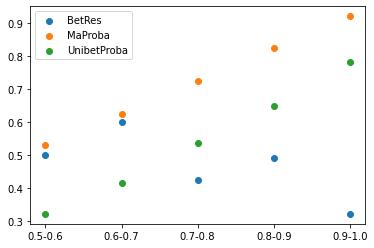

,BetRes,MaProba,UnibetProba
MaProbCat,,,
0.5-0.6,0.500000,0.531250,0.323429
0.6-0.7,0.600000,0.626136,0.416078
0.7-0.8,0.426471,0.724064,0.537284
0.8-0.9,0.491228,0.823844,0.650465
0.9-1.0,0.322581,0.921408,0.782816


In [13]:
GamesDay2 = r.merge(GamesDay, on=["Home", "Away", "DateD"], how='left')
GamesDay2['Result'] = GamesDay2.apply(lambda row: 'D' if row['HomeS'] == row['AwayS'] else 'H' if row['HomeS'] > row['AwayS'] else 'A', axis=1)
GamesDay2['HDA'] = GamesDay2.apply(lambda row: row['Result'] in row['Bet'], axis=1)

GamesDay2['threshold'] = GamesDay2['Bet'].str.split('&', n=1).str[1].str.replace(',', '.').str[1:]


GamesDay2['r'] = GamesDay2['threshold'].apply(lambda row: "L" + row if (row == "DEMP") or (row == "DEM") else np.nan)

GamesDay2['threshold'] = GamesDay2['threshold'].apply(lambda row: np.nan if (row == "DEMP") or (row == "DEM") else row)
GamesDay2['threshold'] = GamesDay2['threshold'].astype(float)


# GamesDay2['r'] = GamesDay2.apply(lambda row: row['r'] if (row['r'] == "LDEMP") or (row['r'] == "LDEM") else row['Bet'].str.split('&', n=1).str[1].str[:1].map({'M': '<', 'P': '>'}))
GamesDay2['r'] = GamesDay2.apply(lambda row: row['r'] if (row['r'] == "LDEMP") or (row['r'] == "LDEM") else ('<' if row['Bet'].split('&')[1][0] == 'M' else '>') if len(row['Bet'].split('&')) >= 2 else np.nan, axis=1)
# GamesDay2['r'] = GamesDay2['Bet'].str.split('&', n=1).str[1].str[:1].map({'M': '<', 'P': '>'})
# GamesDay2['r'] = GamesDay2['Bet'].str.split('&').str[1]

GamesDay2 = pd.DataFrame(GamesDay2).assign(
    HomeS=pd.to_numeric(GamesDay2['HomeS'], errors='coerce'),
    AwayS=pd.to_numeric(GamesDay2['AwayS'], errors='coerce'),
    Goals=lambda x: x['HomeS'] + x['AwayS'],
    CompG=lambda x: np.where(
        x[[#'threshold', 
           'Goals', 'r']].isna().any(axis=1),
        True,
        np.where(
            x['r'] == '<',
            x['Goals'] < x['threshold'],
            np.where(
                x['r'] == '>',
                x['Goals'] > x['threshold'],
                np.where(
                    x['r'] == 'LDEM',
                    (x['HomeS'] > 0) & (x['AwayS'] > 0),
                    np.where(
                        x['r'] == 'LDEMP',
                        (x['HomeS'] == 0) | (x['AwayS'] == 0),
                        None
                    )
                )
            )
        )
    )
)


GamesDay2["BetRes"] = GamesDay2.apply(lambda row: row['CompG'] and row['HDA'], axis=1)
GamesDay3 = GamesDay2.drop(["Result", "HDA", "threshold", "r", "Goals", "CompG"], axis=1)

#Plot
bins = np.arange(0-0.001, 1.1-0.001, 0.1)
labels = [f"{x:.1f}-{x+0.1:.1f}" for x in bins[:-1]]
GamesDay3['MaProbCat'] = pd.cut(GamesDay3['MaProba'], bins=bins, labels=labels)
GamesDay3['UProbCat'] = pd.cut(GamesDay3['UnibetProba'], bins=bins, labels=labels)
grouped_data = GamesDay3.groupby('MaProbCat')[['BetRes', 'MaProba', 'UnibetProba']].mean()
fig, ax = plt.subplots()
ax.scatter(grouped_data.index, grouped_data['BetRes'], label='BetRes')
ax.scatter(grouped_data.index, grouped_data['MaProba'], label='MaProba')
ax.scatter(grouped_data.index, grouped_data['UnibetProba'], label='UnibetProba')
ax.legend()
plt.show()
grouped_data.dropna()
#GamesDay3[GamesDay3["MaProbCat"] == "0.8-0.9"]

In [15]:
GamesDay3[GamesDay3["MaProbCat"] == "0.9-1.0"]

,n,IdGame,Date,Home,Away,Bet,Odd,MaProba,UnibetProba,DiffProba,DateD,Week,HomeS,AwayS,BetRes,MaProbCat,UProbCat
1,10.0,2794823_1,2023-05-13 16:00:00,Manchester United,Wolverhampton,"M3,5",1.4300,0.900000,0.699301,1.287000,2023-05-13,2023W19,NaN,NaN,False,0.9-1.0,0.7-0.8
2,10.0,2774142_1,2023-05-13 21:30:00,Sporting CP,Maritimo,"M3,5",1.4200,0.900000,0.704225,1.278000,2023-05-13,2023W19,NaN,NaN,False,0.9-1.0,0.7-0.8
3,10.0,2774136_1,2023-05-13 19:00:00,Portimonense,Benfica,"M3,5",1.4200,0.900000,0.704225,1.278000,2023-05-13,2023W19,NaN,NaN,False,0.9-1.0,0.7-0.8
4,10.0,2761895_1,2023-05-07 14:00:00,Lyngby,FC Midtjylland,"D/A&M4,5",1.4175,0.900000,0.705467,1.275750,2023-05-07,2023W18,NaN,NaN,True,0.9-1.0,0.7-0.8
5,10.0,2783947_1,2023-05-12 21:00:00,Lens,Reims,"M3,5",1.3900,0.900000,0.719424,1.251000,2023-05-12,2023W19,NaN,NaN,False,0.9-1.0,0.7-0.8
6,10.0,2784201_1,2023-05-06 13:00:00,Hansa Rostock,Jahn Regensburg,H/A,1.3000,0.950000,0.769231,1.235000,2023-05-06,2023W18,NaN,NaN,True,0.9-1.0,0.7-0.8
7,10.0,2785540_1,2023-05-08 16:00:00,Fulham,Leicester,"M3,5",1.3700,0.900000,0.729927,1.233000,2023-05-08,2023W19,NaN,NaN,False,0.9-1.0,0.7-0.8
8,10.0,2750083_1,2023-05-14 14:30:00,Sturm Graz,Austria Klagenfurt,"H/A&P1,5",1.3545,0.900000,0.738280,1.219050,2023-05-14,2023W19,NaN,NaN,True,0.9-1.0,0.7-0.8
9,10.0,2687306_1,2023-05-20 21:00:00,Barcelona,Real Sociedad,"M3,5",1.3500,0.900000,0.740741,1.215000,2023-05-20,2023W20,NaN,NaN,False,0.9-1.0,0.7-0.8
10,10.0,2794094_1,2023-05-07 19:00:00,Aris,AEK Athens,"H/A&M4,5",1.3440,0.900000,0.744048,1.209600,2023-05-07,2023W18,NaN,NaN,True,0.9-1.0,0.7-0.8
